In [0]:
import os
import numpy as np
import itertools
from itertools import combinations 
from collections import Counter
import matplotlib
import matplotlib.pyplot as plt

import networkx as nx
import community
from networkx.algorithms import community as nx_com
from networkx.algorithms.cluster import clustering

import plotGraphs as plt_g
import read_egoNetwork as read_ego
import commdect_algos_eval as algorithms
import time

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


Retrive all 10 Ego Networks of snap facebook dataset and plot them

In [5]:
path = 'drive/My Drive/facebook/'
egoNodes = read_ego.read_edge_files(path)

Edge files of existing egonetworks:  ['348.edges', '686.edges', '698.edges', '107.edges', '0.edges', '414.edges', '3437.edges', '1684.edges', '3980.edges', '1912.edges'] 

nodes representing egonetworks:  [0, 107, 348, 414, 686, 698, 1684, 1912, 3437, 3980]


ego network :  0
Name: 
Type: Graph
Number of nodes: 334
Number of edges: 2852
Average degree:  17.0778



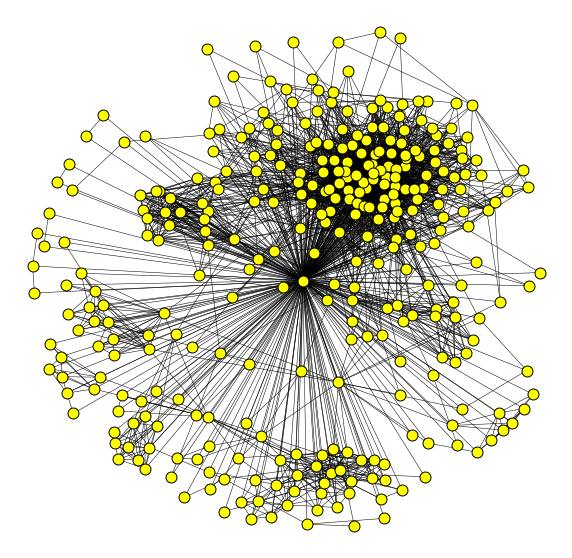

ego network :  107
Name: 
Type: Graph
Number of nodes: 1035
Number of edges: 27783
Average degree:  53.6870



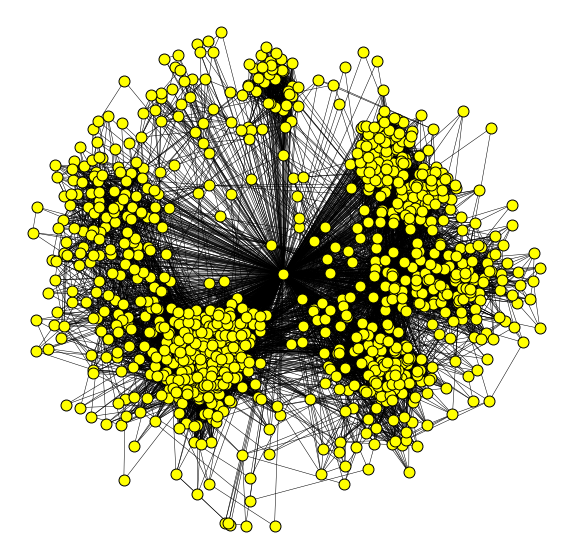

ego network :  348
Name: 
Type: Graph
Number of nodes: 225
Number of edges: 3416
Average degree:  30.3644



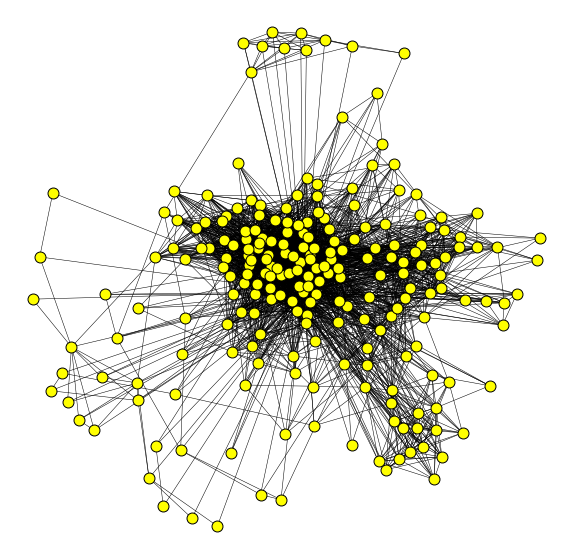

ego network :  414
Name: 
Type: Graph
Number of nodes: 151
Number of edges: 1843
Average degree:  24.4106



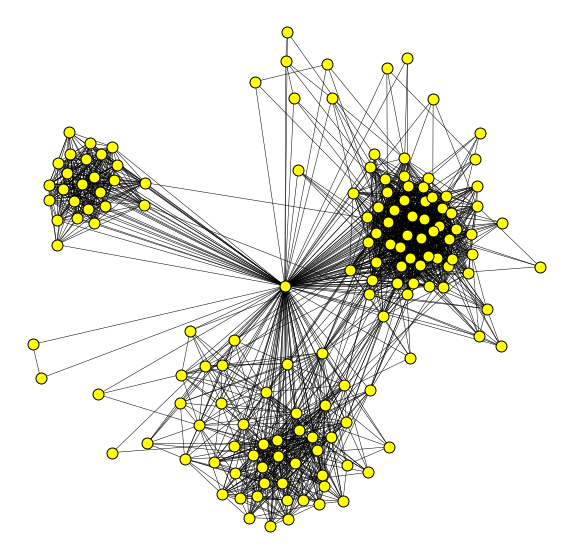

ego network :  686
Name: 
Type: Graph
Number of nodes: 169
Number of edges: 1824
Average degree:  21.5858



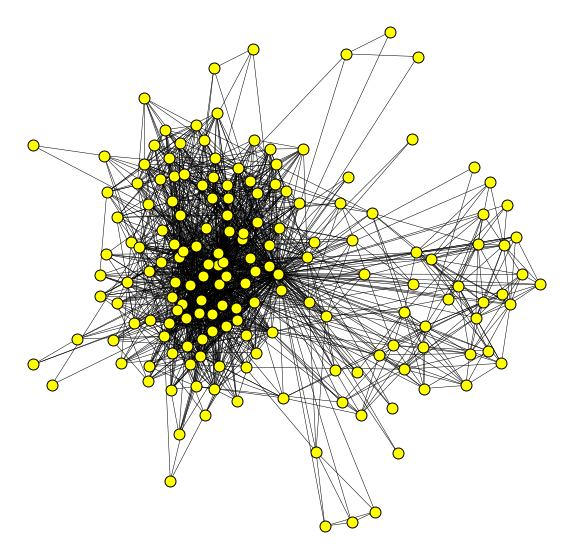

ego network :  698
Name: 
Type: Graph
Number of nodes: 62
Number of edges: 331
Average degree:  10.6774



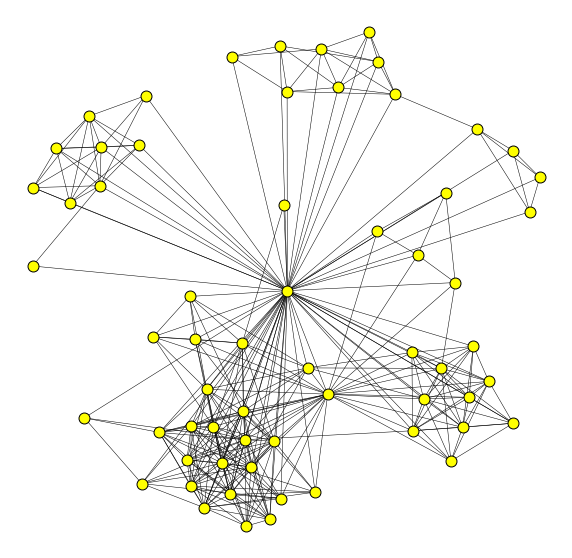

ego network :  1684
Name: 
Type: Graph
Number of nodes: 787
Number of edges: 14810
Average degree:  37.6366



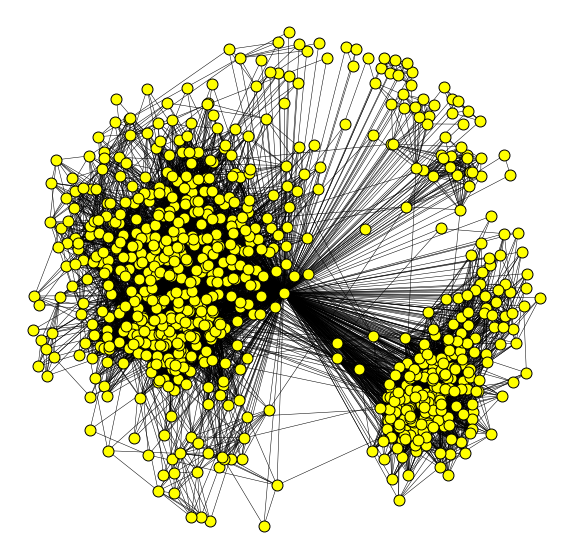

ego network :  1912
Name: 
Type: Graph
Number of nodes: 748
Number of edges: 30772
Average degree:  82.2781



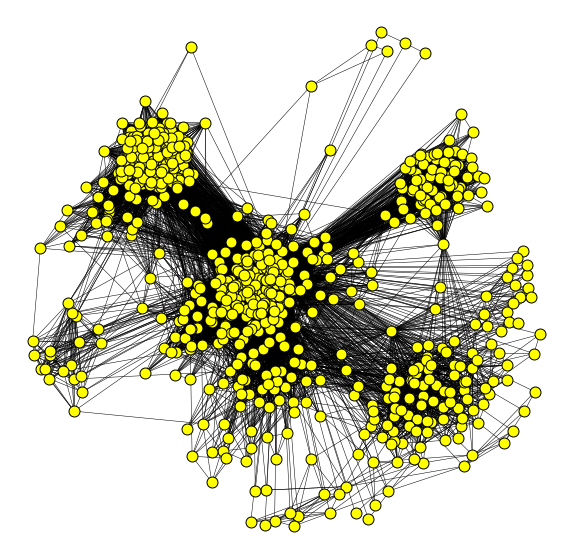

ego network :  3437
Name: 
Type: Graph
Number of nodes: 535
Number of edges: 5347
Average degree:  19.9888



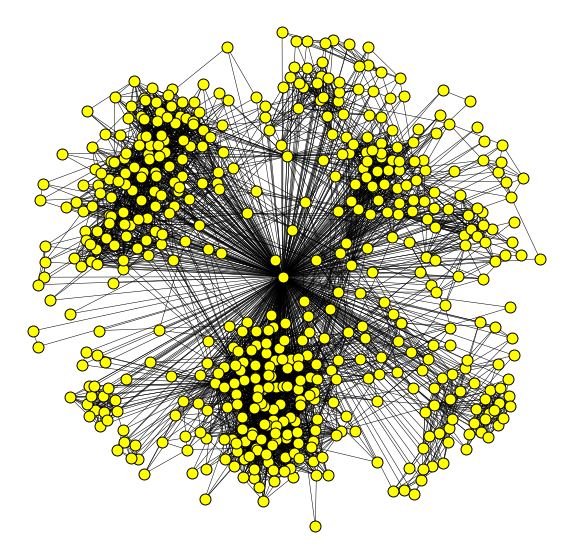

ego network :  3980
Name: 
Type: Graph
Number of nodes: 53
Number of edges: 198
Average degree:   7.4717



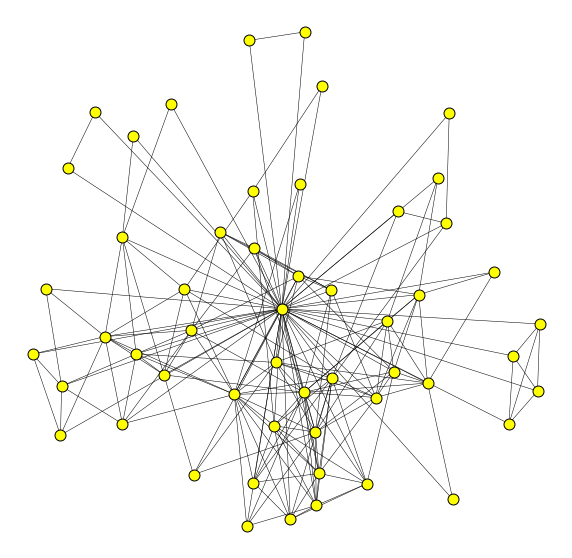

In [6]:
ego_graphs,total_edges = read_ego.create_graph(egoNodes,path)

Detect Communities of Each Ego Network

Community Detection using Girvan Newman

time taken for 0 st Ego network 5.999999999062311e-06 seconds
community count:  2


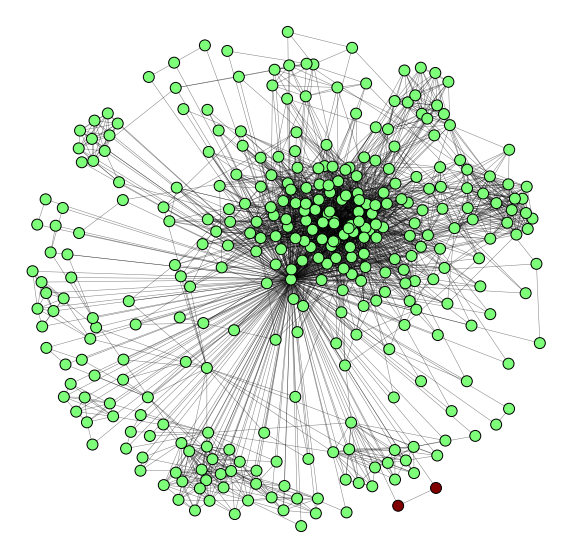

Modularity of community partitions:  0 
 0.0007002787345412706 

time taken for 1 st Ego network 0.00039599999999850866 seconds
community count:  2


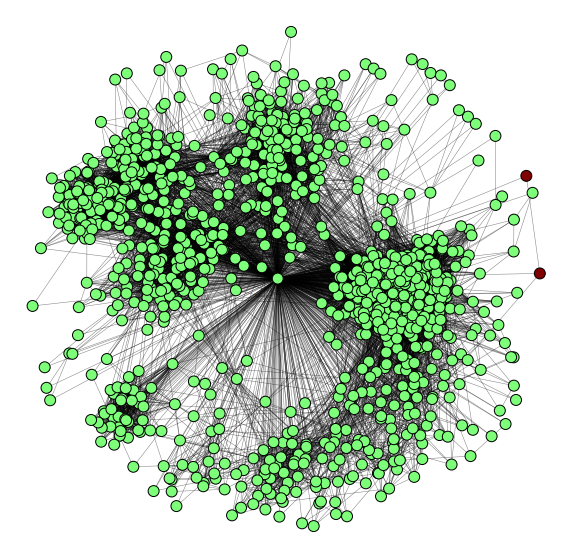

Modularity of community partitions:  1 
 7.197027263370163e-05 

time taken for 2 st Ego network 0.004290999999994938 seconds
community count:  2


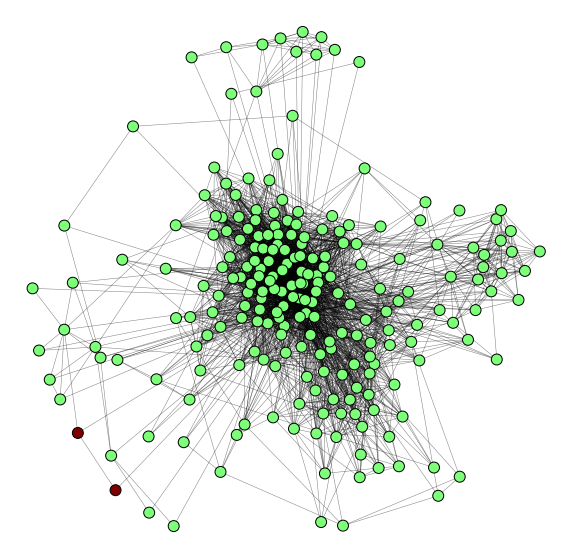

Modularity of community partitions:  2 
 0.0005844088844890363 

time taken for 3 st Ego network 0.0004250000000070031 seconds
community count:  2


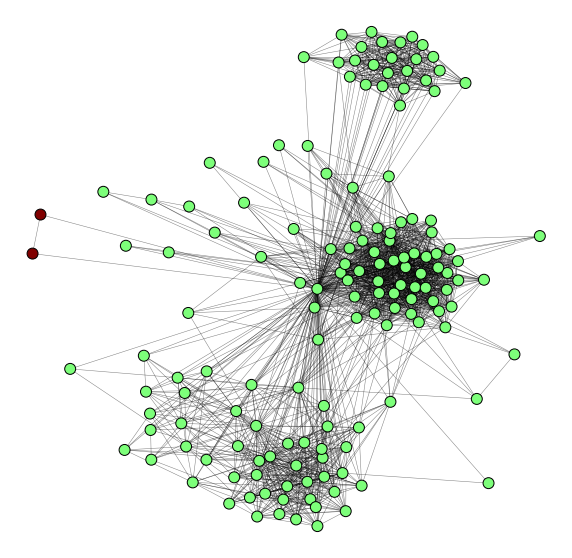

Modularity of community partitions:  3 
 0.001082831932295615 

time taken for 4 st Ego network 0.00033499999999264674 seconds
community count:  2


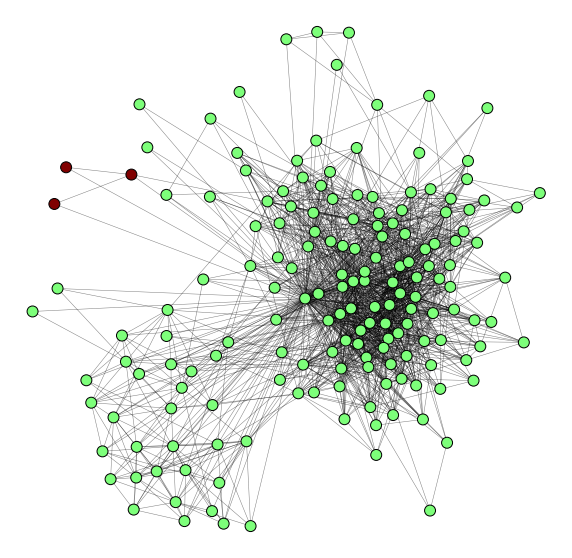

Modularity of community partitions:  4 
 0.002183364112034525 

time taken for 5 st Ego network 0.00037700000000029377 seconds
community count:  2


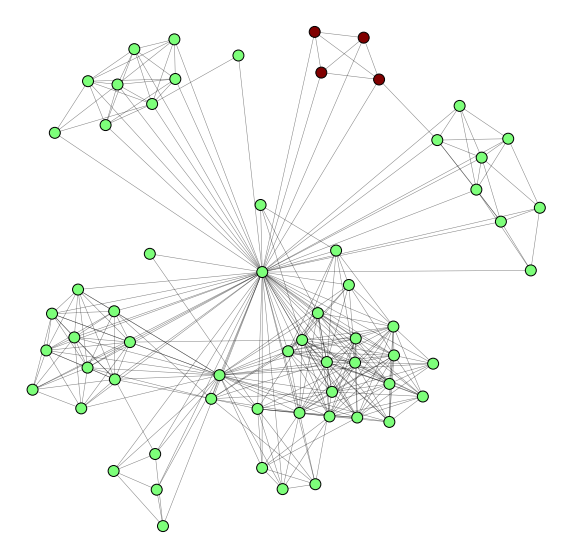

Modularity of community partitions:  5 
 0.034934876461514636 

time taken for 6 st Ego network 4.100000001017179e-05 seconds
community count:  2


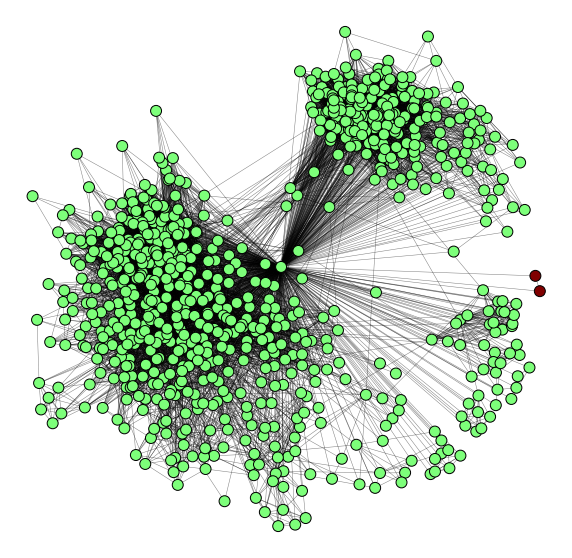

Modularity of community partitions:  6 
 0.00013500741556005965 

time taken for 7 st Ego network 0.0020540000000011105 seconds
community count:  2


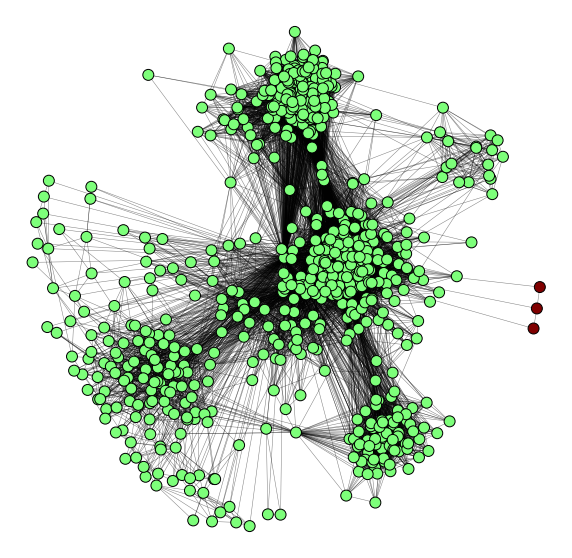

Modularity of community partitions:  7 
 0.00012996242758524278 

time taken for 8 st Ego network 0.004504999999994652 seconds
community count:  2


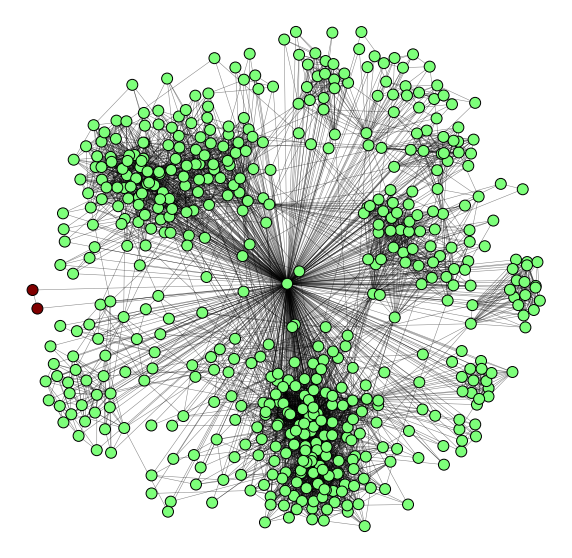

Modularity of community partitions:  8 
 0.0003737617044931936 

time taken for 9 st Ego network 0.0008349999999950342 seconds
community count:  2


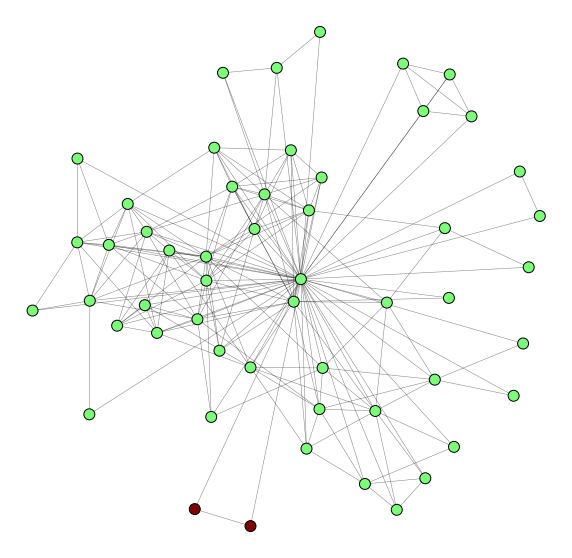

Modularity of community partitions:  9 
 0.00989694929088863 

Total time taken to cluster all ego Networks:  0.001326499999999342 seconds


In [7]:
# Community detection for each ego network using Girvan Newman algorithm with no 

communities = []
modularity = []
time_k2 = []



for i, graph in enumerate(ego_graphs):
    st = time.clock()

    girvan_communities = algorithms.girvan_newman(graph)
    et = time.clock() - st
    print("time taken for", i, "st Ego network",et, "seconds")
    time_k2.append(et)
    communities_list = list(sorted(c) for c in next(girvan_communities))
    pos = nx.spring_layout(graph)
    plt_g.plot_girvan_communities(graph,pos,communities_list,10,'ego_'+str(egoNodes[i])+'comm'+ str(i))
    modul = nx_com.modularity(graph,communities_list)
    print("Modularity of community partitions: ",i,'\n',modul,'\n')
    communities.append(communities_list)
    modularity.append(modul)
    
print("Total time taken to cluster all ego Networks: ",(sum(time_k2)/10) ,"seconds")

In [18]:
print("Modularity of all ego network communities graph for Girvan Newman K =2 : ", sum(modularity)/10)

Modularity of all ego network communities graph for Girvan Newman K =2 :  0.0050093411236035905


In [0]:
clustering_coffe = []
density_par = []
separ = []

Evaluating Girvan Newman communities without ground truth table.
Evaluation metrics : Modularity, Separability, Cluster Coefficient, Density of the formed communities

Name: 
Type: Graph
Number of nodes: 58
Number of edges: 319
Average degree:  11.0000



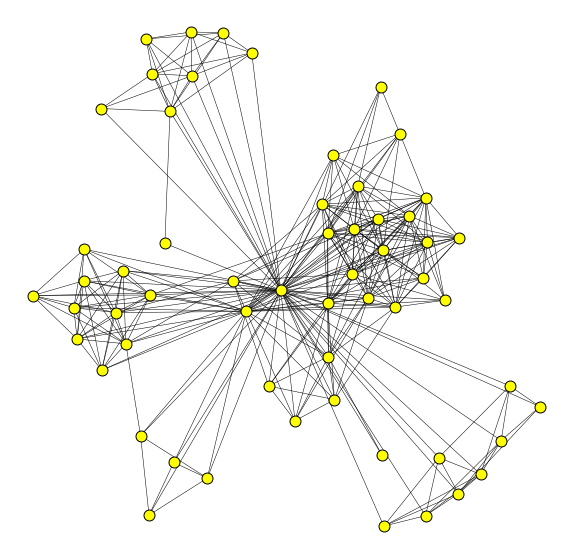

Clustering coefficent : 0.8027965605255928 

Density:  0.19298245614035087 

Separability:  1.1312056737588652 



In [23]:
comm_graph, comm_edges = read_ego.read_communities_detected(communities[5][0],total_edges[5],egoNodes[5])

# Clustering coefficient

cluster_cof = nx.average_clustering(comm_graph)
print("Clustering coefficent :",cluster_cof,'\n')
clustering_coffe.append(cluster_cof)

# Density

density = nx.density(comm_graph) 
print("Density: ",density,'\n')
density_par.append(density)

# Separability

internal_edges = len(comm_edges)
external_edges = len(list(set(total_edges[5]) - set(comm_edges)))
separability = internal_edges / external_edges
print("Separability: ",separability,'\n')
separ.append(separability)

In [90]:
print("Average Cluster coefficient of ego network 698 communities for girvan newman k = 2: ", sum(clustering_coffe)/len(clustering_coffe))

Average Cluster coefficient of ego network 698 communities for girvan newman k = 2:  0.9013982802627964


In [91]:
print("Average Density of ego network 698 communities for girvan newman k = 2: ", sum(density_par)/len(density_par))

Average Density of ego network 698 communities for girvan newman k = 2:  0.5964912280701754


In [92]:
print("Average Separability of ego network 698 communities for girvan newman k = 2: ", sum(separ)/len(separ))

Average Separability of ego network 698 communities for girvan newman k = 2:  0.5706448536861553


Evaluate Girvan newman communities using grouth truth tbale : circles files w.r.t loss function

In [10]:
predict_circles = communities
true_circles = read_ego.read_circles(egoNodes,path)
cost = [] 

total_loss = 0

for i, ego in enumerate(egoNodes):
    
    loss = algorithms.compute_lossfunction(true_circles[i], predict_circles[i])
    cost.append(loss)
    total_loss += loss

    print("Cost required to update predicted communities w.r.t true circles for ego network : ",i,loss,'\n')
    
print("Total cost required to update predicted communities w.r.t true circles for all ego networks : ",total_loss,'\n')
print("Average cost required to update predicted communities w.r.t true circles for all ego networks : ",(total_loss/len(egoNodes)),'\n')

Cost required to update predicted communities w.r.t true circles for ego network :  0 661.0 

Cost required to update predicted communities w.r.t true circles for ego network :  1 1530.0 

Cost required to update predicted communities w.r.t true circles for ego network :  2 601.0 

Cost required to update predicted communities w.r.t true circles for ego network :  3 323.0 

Cost required to update predicted communities w.r.t true circles for ego network :  4 534.0 

Cost required to update predicted communities w.r.t true circles for ego network :  5 155.0 

Cost required to update predicted communities w.r.t true circles for ego network :  6 1452.0 

Cost required to update predicted communities w.r.t true circles for ego network :  7 1915.0 

Cost required to update predicted communities w.r.t true circles for ego network :  8 769.0 

Cost required to update predicted communities w.r.t true circles for ego network :  9 133.0 

Total cost required to update predicted communities w.r.t

In [27]:
cost

[661.0, 1530.0, 601.0, 323.0, 534.0, 155.0, 1452.0, 1915.0, 769.0, 133.0]

Detect Communities uisng Girvan newman with K cluster 

In [0]:
communities_k5 = []
modularity_k5 = []
k = 5

community count:  6


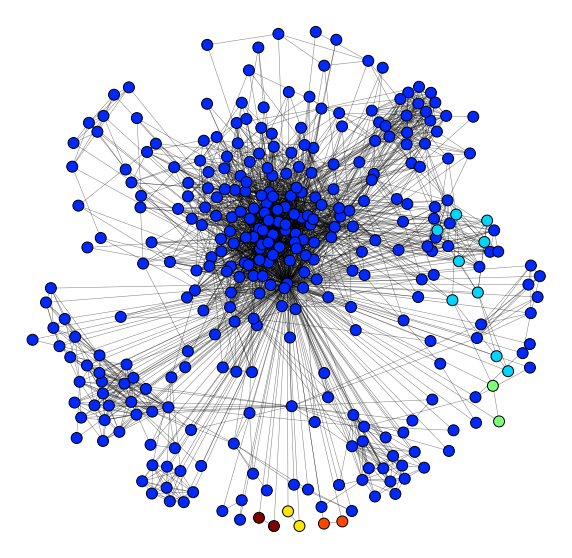

Modularity of community partitions:  0 
 0.016158722797809954 

time taken for 0 st Ego network 3.800000001774606e-05 seconds
community count:  6


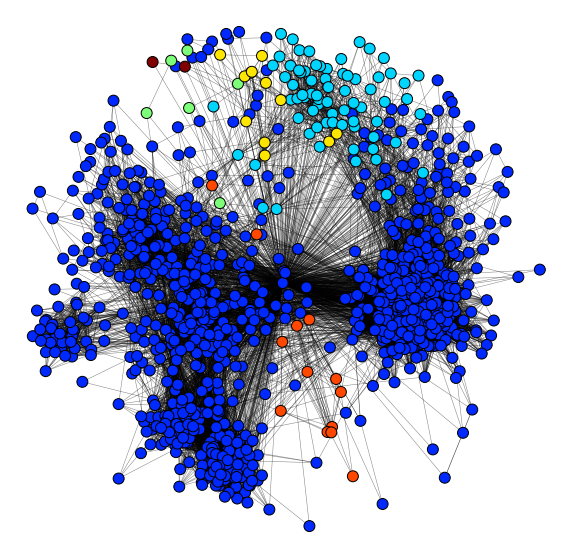

Modularity of community partitions:  107 
 0.04169224802518054 

time taken for 1 st Ego network 0.0005840000000034706 seconds
community count:  6


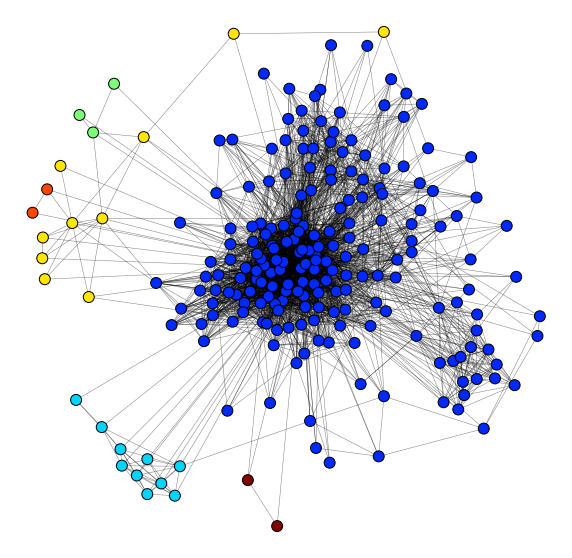

Modularity of community partitions:  348 
 0.029557875118604186 

time taken for 2 st Ego network 0.004971000000296044 seconds
community count:  6


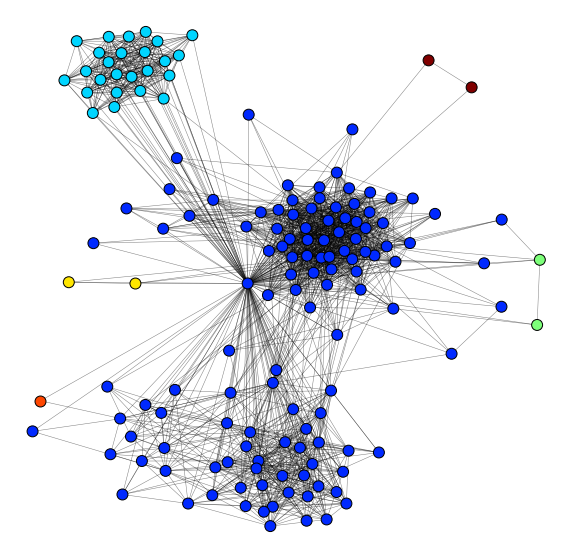

Modularity of community partitions:  414 
 0.23962631994062414 

time taken for 3 st Ego network 0.0004779999999300344 seconds
community count:  6


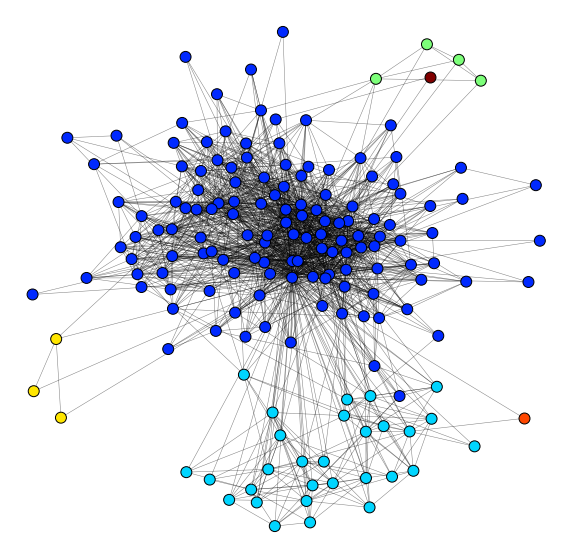

Modularity of community partitions:  686 
 0.1271982424880731 

time taken for 4 st Ego network 0.0003619999988586642 seconds
community count:  6


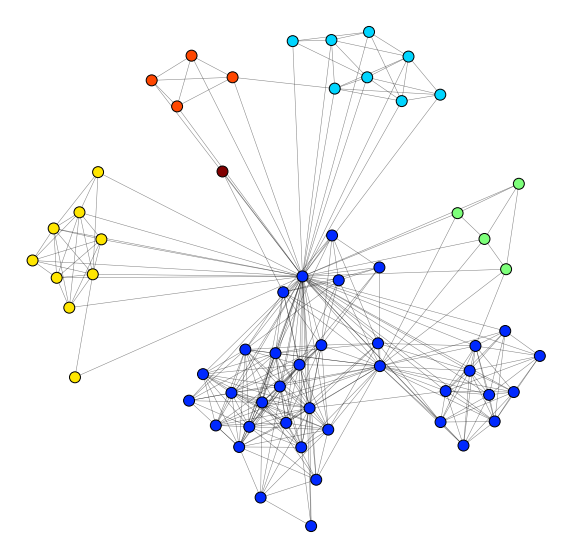

Modularity of community partitions:  698 
 0.2700778561714466 

time taken for 5 st Ego network 0.00035600000046542846 seconds
community count:  6


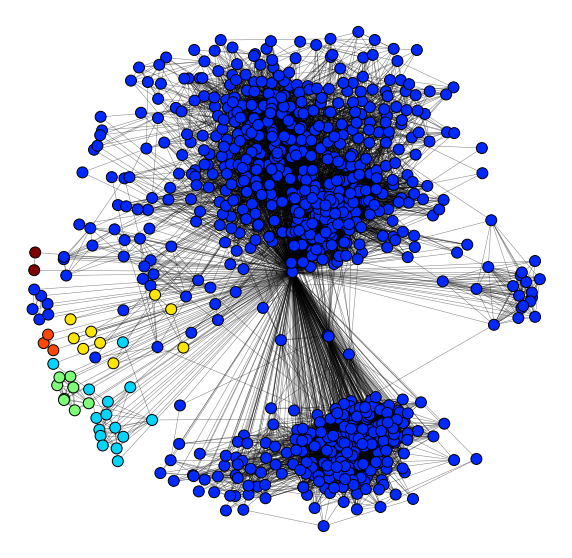

Modularity of community partitions:  1684 
 0.012543005916489134 

time taken for 6 st Ego network 5.100000089441892e-05 seconds
community count:  6


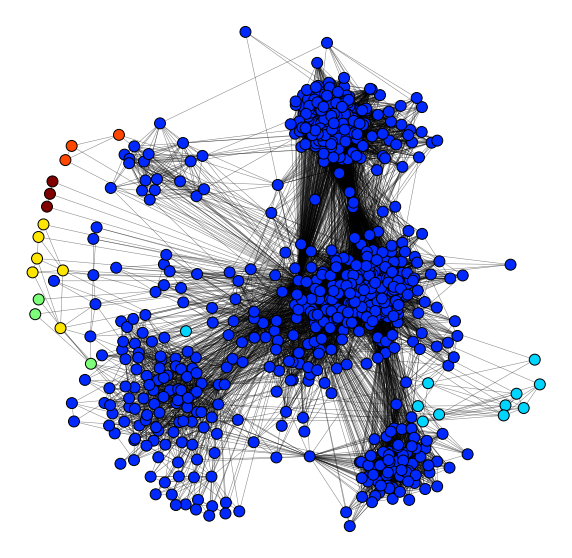

Modularity of community partitions:  1912 
 0.0030798186420727593 

time taken for 7 st Ego network 0.0021849999993719393 seconds
community count:  6


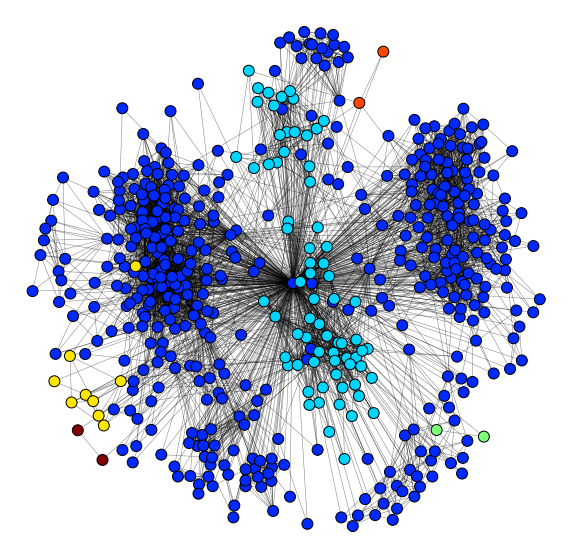

Modularity of community partitions:  3437 
 0.19730747818263591 

time taken for 8 st Ego network 0.005912999999054591 seconds
community count:  6


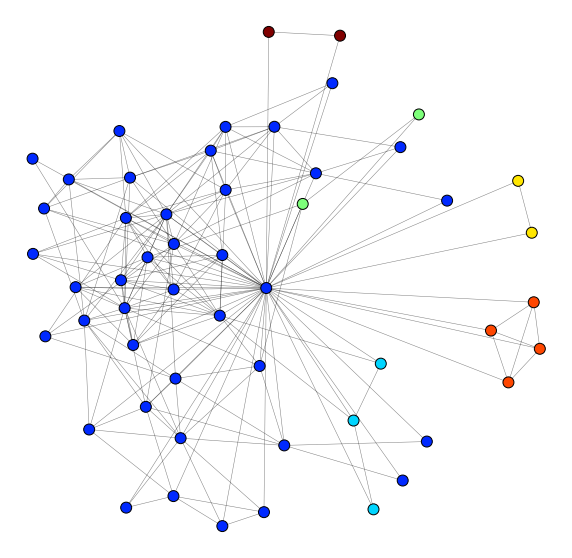

Modularity of community partitions:  3980 
 0.09882920110192818 

time taken for 9 st Ego network 0.0008360000010725344 seconds
Total time taken to cluster all ego Networks:  0.0015773999999964873 seconds


In [12]:
# Community detection for K = 5 clusters on Ego Network 698

communities_list_k5 = []
time_k5 = []

for i, graph in enumerate(ego_graphs):
  st = time.clock()
  girvan_communities = algorithms.girvan_newman(graph)
  et = time.clock() - st
  for comm in itertools.islice(girvan_communities, k):
      communities_list_k5.append((sorted(c) for c in comm))

  community_list_k5 = list(communities_list_k5[-1])
  pos = nx.spring_layout(graph)
  plt_g.plot_girvan_communities(graph,pos,community_list_k5,10,'ego_'+str(egoNodes[i])+'comm_k5')

  modul = nx_com.modularity(graph,community_list_k5)
  print("Modularity of community partitions: ",str(egoNodes[i]),'\n',modul,'\n')

  communities_k5.append(community_list_k5)
  modularity_k5.append(modul)
  print("time taken for", i, "st Ego network",et, "seconds")
  time_k5.append(et)

print("Total time taken to cluster all ego Networks: ",sum(time_k5)/10 ,"seconds")

In [29]:
print("Modularity of all ego network communities graph for Girvan Newman K =5 : ", sum(modularity_k5)/10)

Modularity of all ego network communities graph for Girvan Newman K =5 :  0.10360707683848644


Evaluating Girvan Newman communities without ground truth table. Evaluation metrics : Modularity, Separability, Cluster Coefficient, Density of the formed communities

In [0]:
clustering_coffe_k5 = []
density_par_k5 = []
separ_k5 = []

Name: 
Type: Graph
Number of nodes: 8
Number of edges: 19
Average degree:   4.7500



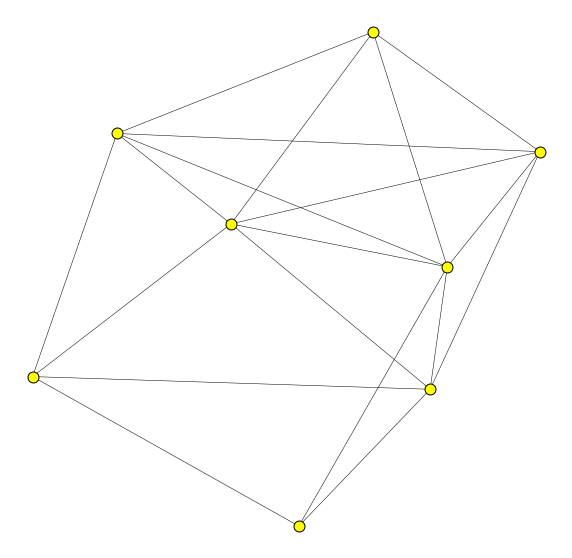

Clustering coefficent : 0.6916666666666667 

Density:  0.6785714285714286 

Separability:  0.03264604810996564 



In [100]:
comm_graph_k5, comm_edges_k5 = read_ego.read_communities_detected(communities_k5[5][1],total_edges[5],egoNodes[5])

# Clustering coefficient

cluster_cof_k5 = nx.average_clustering(comm_graph_k5)
print("Clustering coefficent :",cluster_cof_k5,'\n')
clustering_coffe_k5.append(cluster_cof_k5)

# Density

density_k5 = nx.density(comm_graph_k5) 
print("Density: ",density_k5,'\n')
density_par_k5.append(density_k5)


# Separability

internal_edges_k5 = len(comm_edges_k5)
external_edges_k5 = len(list(set(total_edges[5]) - set(comm_edges_k5)))
separability_k5 = internal_edges_k5 / external_edges_k5
print("Separability: ",separability_k5,'\n')
separ_k5.append(separability_k5)



In [49]:
clustering_coffe_k5


[0.7836577467016925,
 0.6916666666666667,
 0.8333333333333333,
 0.7735449735449735,
 1.0]

In [50]:
density_par_k5


[0.3873015873015873,
 0.6785714285714286,
 0.8333333333333334,
 0.6666666666666666,
 1.0]

In [51]:
separ_k5

[0.6834733893557423,
 0.03264604810996564,
 0.008389261744966443,
 0.0415944540727903,
 0.010084033613445379]

In [93]:
print("Average Cluster coefficient of ego network 698 communities for girvan newman k = 2: ", sum(clustering_coffe_k5)/len(clustering_coffe_k5))

Average Cluster coefficient of ego network 698 communities for girvan newman k = 2:  0.8164405440493333


In [94]:
print("Average Density of ego network 698 communities for girvan newman k = 2: ", sum(density_par_k5)/len(density_par_k5))

Average Density of ego network 698 communities for girvan newman k = 2:  0.7131746031746031


In [95]:
print("Average Separability of ego network 698 communities for girvan newman k = 2: ", sum(separ_k5)/len(separ_k5))

Average Separability of ego network 698 communities for girvan newman k = 2:  0.155237437379382


Evaluate Girvan newman communities using grouth truth tbale : circles files w.r.t loss function

In [59]:
predict_circles_k5 = communities_k5
true_circles_k5 = read_ego.read_circles(egoNodes,path)

 
cost_k5 = []

total_loss_k5 = 0

for i, ego in enumerate(egoNodes):
    
    loss = algorithms.compute_lossfunction(true_circles_k5[i], predict_circles_k5[i])
    cost_k5.append(loss)
    total_loss_k5 += loss

    print("Cost required to update predicted communities w.r.t true circles for ego network : ",i,loss,'\n')
    
print("Total cost required to update predicted communities w.r.t true circles for all ego networks : ",total_loss_k5,'\n')
print("Average cost required to update predicted communities w.r.t true circles for all ego networks : ",(total_loss_k5/len(egoNodes)),'\n')

Cost required to update predicted communities w.r.t true circles for ego network :  0 655.0 

Cost required to update predicted communities w.r.t true circles for ego network :  1 1504.0 

Cost required to update predicted communities w.r.t true circles for ego network :  2 592.0 

Cost required to update predicted communities w.r.t true circles for ego network :  3 311.0 

Cost required to update predicted communities w.r.t true circles for ego network :  4 485.0 

Cost required to update predicted communities w.r.t true circles for ego network :  5 128.0 

Cost required to update predicted communities w.r.t true circles for ego network :  6 1444.0 

Cost required to update predicted communities w.r.t true circles for ego network :  7 1903.0 

Cost required to update predicted communities w.r.t true circles for ego network :  8 761.0 

Cost required to update predicted communities w.r.t true circles for ego network :  9 121.0 

Total cost required to update predicted communities w.r.t

In [60]:
cost_k5

[655.0, 1504.0, 592.0, 311.0, 485.0, 128.0, 1444.0, 1903.0, 761.0, 121.0]

Detect Communities uisng Louvian Algorithm 

Found community count:  9.0


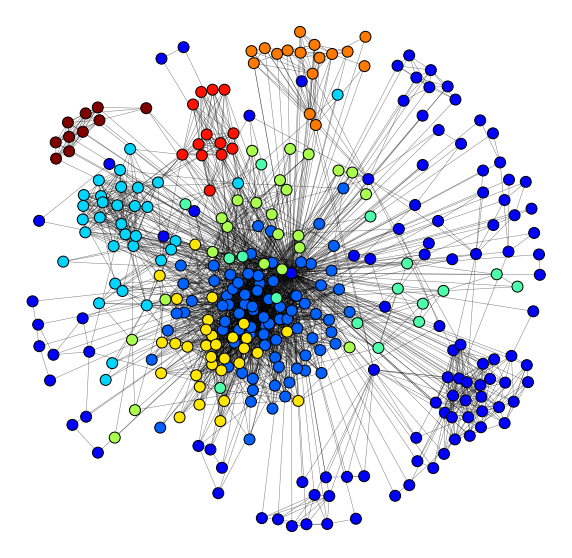

Modularity of community partitions:  0 
 0.4308935782866382 

Modified Dictionary defaultdict(<class 'list'>, {0: [0, 117, 23, 116, 288, 270, 76, 28, 312, 214, 20, 307, 71, 333, 283, 144, 226, 149, 17, 326, 255, 49, 140, 137, 343, 115, 111, 14, 310, 32, 230, 70, 228, 286, 81, 174, 293, 33, 42, 2, 279, 162, 19, 192, 243, 8, 245, 173, 259, 167, 91, 61, 93, 41, 6, 89, 301, 337, 110, 264, 201, 289, 262, 220, 234, 44, 193, 97, 124, 112, 90, 179, 216, 151, 145, 157, 327, 95, 120, 247, 190, 282, 244, 319, 233, 256, 166, 202, 155, 147, 229, 138, 240, 77, 219, 305, 153, 154, 198, 182, 241, 294, 253, 267, 205, 47, 183, 52, 34], 1: [236, 186, 122, 285, 271, 304, 176, 9, 252, 332, 276, 26, 280, 272, 133, 62, 239, 322, 3, 170, 56, 188, 315, 323, 200, 344, 67, 277, 134, 274, 21, 169, 207, 341, 334, 141, 345, 158, 109, 291, 142, 105, 232, 248, 224, 290, 25, 161, 66, 85, 123, 297, 185, 104, 30, 72, 40, 212, 39, 10, 55, 69, 113, 258, 257, 156, 303, 75, 318, 165, 121, 60, 45, 96, 235, 79, 208, 132, 221,

<Figure size 936x360 with 0 Axes>

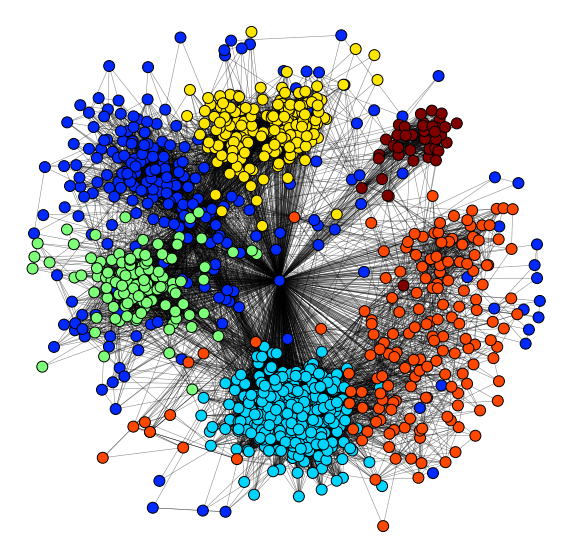

Modularity of community partitions:  1 
 0.5277183121189672 

Modified Dictionary defaultdict(<class 'list'>, {0: [107, 1200, 1202, 1412, 1366, 1472, 1566, 1355, 1236, 944, 1428, 1569, 1444, 1876, 1703, 1686, 924, 1260, 1473, 1064, 1760, 1070, 1436, 1213, 1005, 1497, 1540, 1478, 1743, 1139, 914, 1041, 1496, 1228, 1342, 1469, 1011, 1072, 1435, 1492, 1348, 1630, 1415, 949, 1815, 968, 1727, 1418, 1167, 1246, 1529, 1536, 1042, 1189, 1296, 1109, 939, 1356, 1599, 1901, 1131, 1304, 1159, 1738, 1338, 1500, 1634, 1310, 1177, 1831, 1010, 1504, 1770, 1531, 1709, 1134, 1756, 1225, 1830, 1525, 1453, 1889, 1499, 1275, 1482, 1785, 1807, 1051, 1699, 1541, 994, 1394, 1240, 1022, 1000, 1474, 1258, 1226, 1052, 1781, 913, 1121, 1885, 1154, 1650, 1818, 1141, 1696, 1062, 1507, 977, 1306, 1624, 931, 1188, 1234, 1906, 956, 1308, 1725, 1633, 1035, 1217, 1640, 1748, 1646, 1046, 1586, 1672, 1311, 1259, 1745, 1299, 1093, 1681, 1106, 1127, 1090, 1667, 1546, 1152, 1481, 1268, 1183, 1364, 940, 1170, 964, 1664, 1403,

<Figure size 936x360 with 0 Axes>

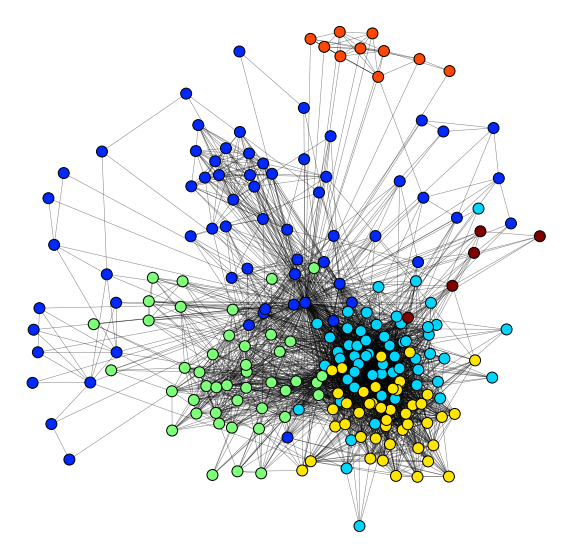

Modularity of community partitions:  2 
 0.29131850939784676 

Modified Dictionary defaultdict(<class 'list'>, {0: [348, 510, 521, 469, 516, 173, 549, 457, 477, 563, 397, 419, 443, 453, 504, 426, 540, 464, 552, 533, 543, 455, 467, 572, 424, 421, 427, 407, 357, 350, 369, 551, 381, 486, 459, 389, 435, 437, 528, 518, 380, 532, 498, 509, 554, 449, 541, 571, 480, 468, 406, 505, 433, 485, 34, 356, 411, 384, 472, 386, 499, 379, 401, 377, 383], 1: [436, 428, 565, 471, 461, 544, 414, 465, 402, 520, 567, 542, 378, 506, 514, 373, 460, 395, 370, 423, 524, 496, 451, 363, 371, 420, 432, 448, 444, 523, 561, 365, 507, 439, 513, 387, 527, 413, 495, 553, 556, 558, 445, 417, 488, 374, 438, 425, 360, 473, 569, 570, 362, 415, 535, 385], 2: [450, 531, 546, 547, 475, 367, 452, 361, 359, 557, 376, 555, 500, 418, 396, 548, 382, 474, 403, 422, 458, 470, 519, 372, 490, 355, 463, 442, 491, 354, 539, 568, 405, 466, 429, 410, 481, 502, 489, 390, 562, 529, 522, 530], 3: [538, 404, 412, 446, 536, 398, 560, 493, 559, 

<Figure size 936x360 with 0 Axes>

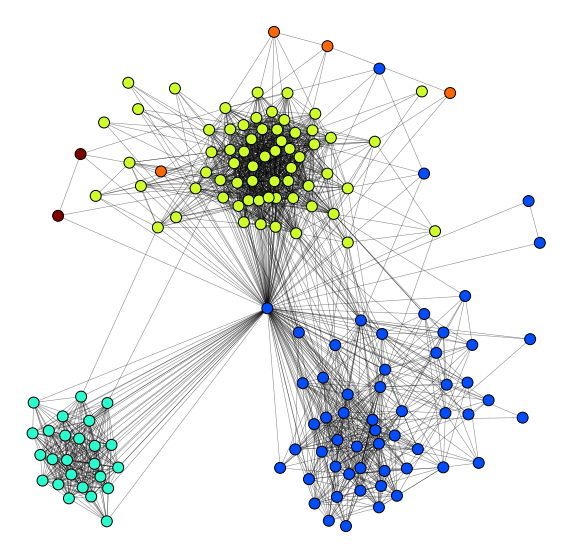

Modularity of community partitions:  3 
 0.5085593183163758 

Modified Dictionary defaultdict(<class 'list'>, {0: [414, 636, 630, 597, 619, 664, 666, 633, 680, 609, 579, 663, 596, 684, 422, 589, 685, 575, 623, 625, 654, 611, 612, 644, 588, 617, 678, 592, 603, 620, 480, 590, 618, 672, 573, 605, 653, 655, 626, 677, 616, 584, 598, 622, 631, 682, 593, 639, 657, 621, 574, 660, 648, 679, 642, 581], 1: [650, 647, 665, 583, 632, 643, 681, 577, 578, 635, 627, 600, 582, 599, 662, 640, 615, 628, 661, 670, 595, 658, 675, 576, 659], 2: [461, 544, 614, 515, 363, 348, 436, 428, 400, 591, 500, 524, 553, 561, 651, 606, 438, 370, 556, 373, 434, 566, 604, 683, 376, 475, 465, 580, 483, 395, 676, 671, 492, 567, 542, 637, 412, 558, 646, 431, 559, 378, 645, 513, 107, 394, 514, 506, 423, 601, 669, 629, 391, 563, 634, 587, 496, 641, 374, 586, 656, 610, 673, 652], 3: [173, 649, 427, 34], 4: [594, 667]})
Each Ego Node community partitions:  [[414, 636, 630, 597, 619, 664, 666, 633, 680, 609, 579, 663, 596, 684, 

<Figure size 936x360 with 0 Axes>

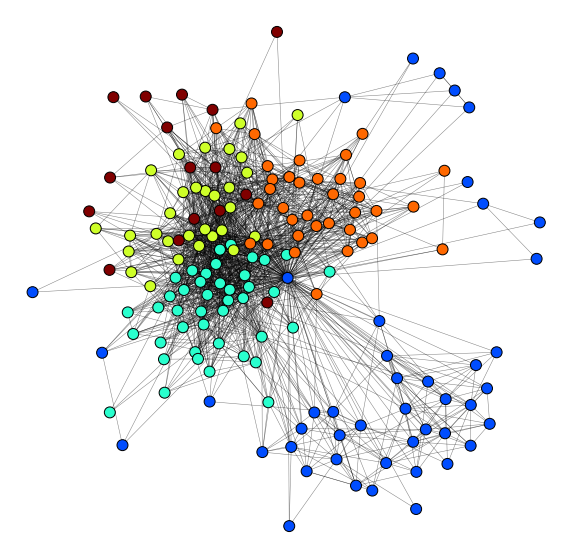

Modularity of community partitions:  4 
 0.3130147316962912 

Modified Dictionary defaultdict(<class 'list'>, {0: [686, 768, 733, 789, 702, 732, 818, 707, 767, 798, 736, 746, 742, 717, 852, 816, 833, 822, 791, 806, 743, 782, 757, 775, 725, 721, 796, 839, 712, 771, 786, 855, 846, 699, 788, 749, 802, 714, 689, 850, 841, 691, 785, 744, 750], 1: [827, 826, 752, 756, 694, 724, 842, 719, 713, 829, 696, 810, 710, 722, 853, 834, 715, 805, 766, 745, 814, 847, 734, 727, 794, 706, 731, 784, 781, 695, 795, 751, 799, 760, 738, 813, 690, 773, 711, 762, 700, 854], 2: [819, 830, 828, 821, 701, 697, 840, 823, 835, 779, 688, 844, 792, 778, 848, 726, 723, 838, 754, 824, 737, 845, 837, 780, 815, 812, 693, 777, 704, 709], 3: [728, 764, 783, 831, 820, 849, 803, 747, 739, 787, 748, 755, 809, 703, 759, 705, 718, 797, 687, 720, 807, 793, 758, 843, 741, 770, 790, 730, 716, 836, 763, 817, 765, 808, 832, 740], 4: [708, 774, 698, 761, 769, 856, 811, 800, 735, 776, 753, 772, 729, 804, 825, 851]})
Each Ego Node comm

<Figure size 936x360 with 0 Axes>

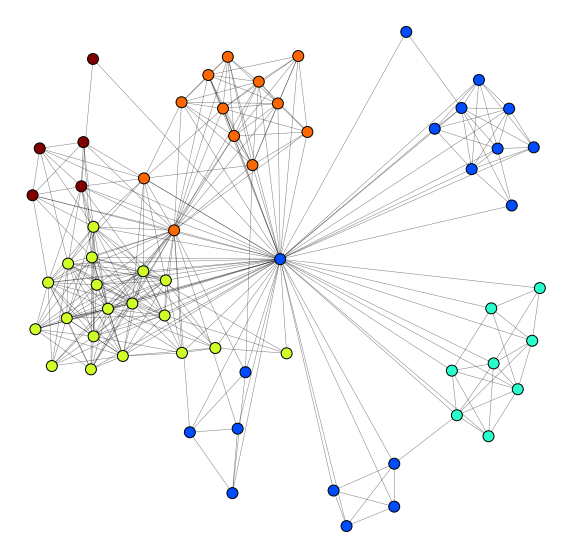

Modularity of community partitions:  5 
 0.4523416179114831 

Modified Dictionary defaultdict(<class 'list'>, {0: [698, 884, 864, 872, 873, 865, 857, 874, 885, 825, 859, 887, 776, 893, 867, 868, 877, 862], 1: [881, 858, 870, 871, 895, 879, 894, 866], 2: [828, 697, 719, 713, 840, 803, 745, 805, 708, 823, 774, 800, 819, 810, 830, 747, 772, 880, 703], 3: [856, 889, 861, 863, 888, 729, 876, 753, 804, 886, 878, 882], 4: [869, 769, 890, 811, 798]})
Each Ego Node community partitions:  [[698, 884, 864, 872, 873, 865, 857, 874, 885, 825, 859, 887, 776, 893, 867, 868, 877, 862], [881, 858, 870, 871, 895, 879, 894, 866], [828, 697, 719, 713, 840, 803, 745, 805, 708, 823, 774, 800, 819, 810, 830, 747, 772, 880, 703], [856, 889, 861, 863, 888, 729, 876, 753, 804, 886, 878, 882], [869, 769, 890, 811, 798]] 

Validate partions:  5 

time taken for 5 st Ego network 0.009512000000540866 seconds
Found community count:  7.0


<Figure size 936x360 with 0 Axes>

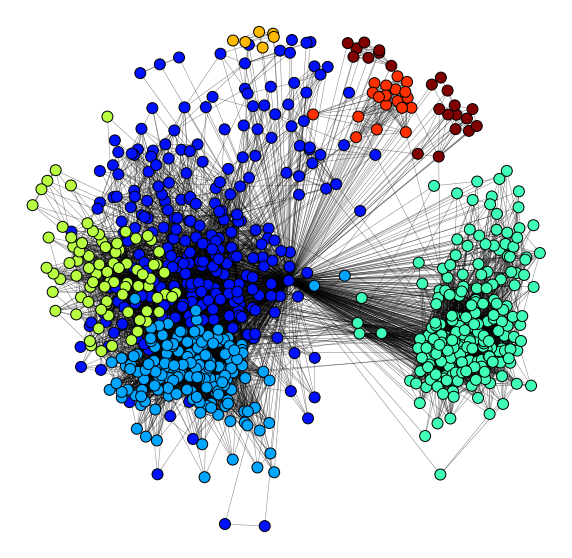

Modularity of community partitions:  6 
 0.5565083996660831 

Modified Dictionary defaultdict(<class 'list'>, {0: [1684, 2818, 2725, 2832, 3087, 3236, 3327, 2675, 3005, 2787, 3214, 2893, 2771, 3050, 2667, 3173, 2878, 3249, 2801, 3256, 3124, 2803, 3292, 3331, 2730, 3307, 2847, 3361, 2764, 3248, 2856, 3156, 2843, 3263, 3057, 3385, 2795, 2690, 2844, 2718, 3136, 3178, 3208, 2665, 2886, 2999, 3342, 3302, 2783, 2734, 3043, 2871, 3425, 3402, 3107, 3343, 3253, 2688, 3374, 2964, 2715, 2865, 3215, 2968, 3167, 2918, 3289, 2955, 2813, 3380, 2772, 3328, 3144, 3369, 3219, 3259, 3189, 3075, 2921, 2702, 3099, 3242, 3138, 2923, 2677, 3278, 1534, 2938, 2760, 2790, 2883, 2831, 3326, 2996, 3341, 2997, 2933, 1758, 2758, 2700, 3266, 3398, 3222, 2751, 3192, 3313, 3032, 3337, 1450, 3312, 1642, 2848, 3365, 2819, 3418, 3027, 3171, 2841, 2816, 2735, 2709, 2965, 1505, 3245, 1666, 3164, 3151, 3421, 3093, 107, 1726, 3393, 2707, 2932, 3255, 3034, 3323, 3264, 3196, 3097, 2941, 3072, 3254, 990, 2685, 2668, 3140, 2723,

<Figure size 936x360 with 0 Axes>

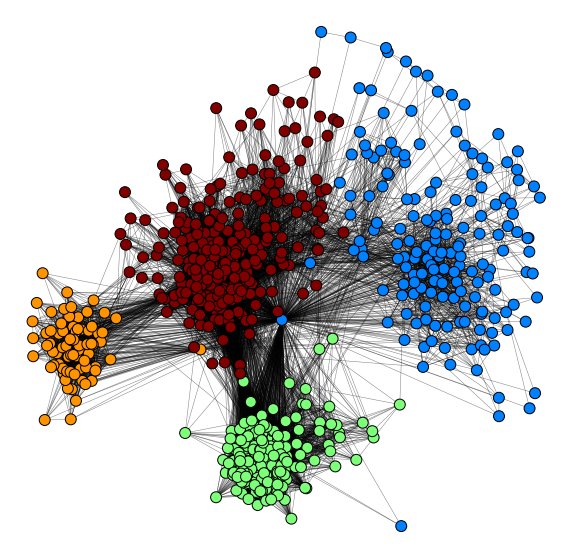

Modularity of community partitions:  7 
 0.5226854862131042 

Modified Dictionary defaultdict(<class 'list'>, {0: [1912, 2650, 2207, 2228, 2082, 2126, 2317, 2412, 2371, 2166, 2357, 2152, 2558, 2375, 2360, 2156, 2397, 1978, 2523, 2158, 2570, 2335, 1960, 2535, 2361, 2503, 2114, 2260, 2120, 2105, 2487, 2245, 1988, 2466, 2197, 2236, 2322, 2644, 1922, 2341, 2628, 1975, 1930, 1934, 2349, 2424, 2313, 1965, 2587, 2170, 2486, 2513, 2041, 2456, 2401, 2540, 2474, 2411, 2314, 2618, 1933, 2403, 2444, 2119, 2316, 2178, 2035, 2049, 2146, 1990, 2450, 2320, 1992, 2405, 2162, 2402, 2238, 2089, 2231, 2076, 2455, 2534, 2130, 2107, 2621, 2091, 1937, 2632, 2528, 2439, 2448, 2181, 2217, 2497, 2017, 2321, 2562, 2106, 2421, 2440, 2129, 2099, 2160, 2251, 2286, 2577, 1936, 2490, 2248, 2342, 1949, 1956, 2281, 2070, 2080, 2167, 2426, 2255, 2622, 2008, 2173, 1915, 2614, 2023, 2193, 2422, 2441, 1961, 2094, 2656, 2100, 2277, 2580, 2380, 2301, 2175, 2481, 2515, 2488, 2015, 2051, 2230, 2034, 2527, 2227, 2113, 1996, 254

<Figure size 936x360 with 0 Axes>

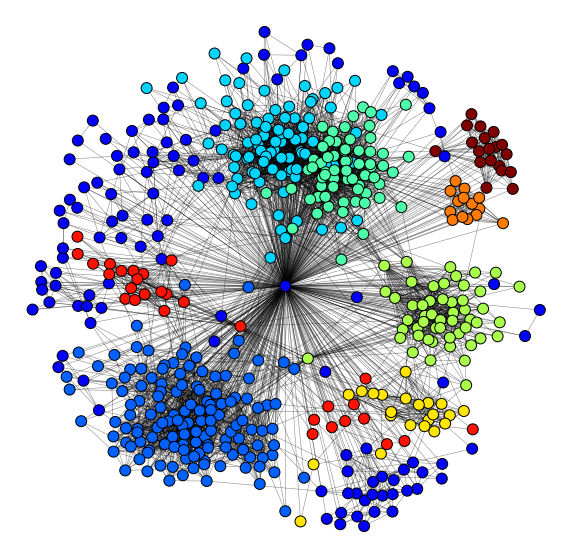

Modularity of community partitions:  8 
 0.6208490581579297 

Modified Dictionary defaultdict(<class 'list'>, {0: [3437, 3549, 3905, 3953, 3775, 3799, 3638, 3813, 3610, 3847, 3950, 3616, 3513, 3716, 3669, 3502, 3522, 3544, 3592, 3490, 3546, 3861, 3954, 3916, 3624, 3745, 3949, 3805, 3812, 3801, 3885, 3679, 3894, 3504, 3487, 3660, 3888, 3530, 3551, 3779, 3659, 3863, 3682, 3652, 3676, 3662, 3872, 3811, 3626, 3727, 3772, 3446, 3897, 3908, 3979, 3848, 3441, 3844, 3536, 3661, 3771, 3911, 3864, 3700, 3925, 3814, 3647, 3688, 3531, 3723, 3489, 3665, 3742, 3849, 3560, 3691, 3580, 3585, 3565, 3959, 3963, 3566, 3904, 3548, 3922, 3928, 3961, 3744, 567, 3806, 3447, 3694, 3444, 3733, 3704, 3932, 3746, 3846, 3717, 3575, 3839, 3606, 3673, 3816, 3952, 3939, 3732, 3439, 3637, 3477, 3808, 3589, 3699], 1: [3825, 3568, 3726, 3972, 3623, 3866, 3793, 3951, 3826, 3869, 3782, 3558, 3620, 3792, 3924, 3969, 3493, 3612, 3937, 3463, 3909, 3510, 3915, 3764, 3758, 3822, 3833, 3529, 3895, 3464, 3718, 3584, 3843, 3719,

<Figure size 936x360 with 0 Axes>

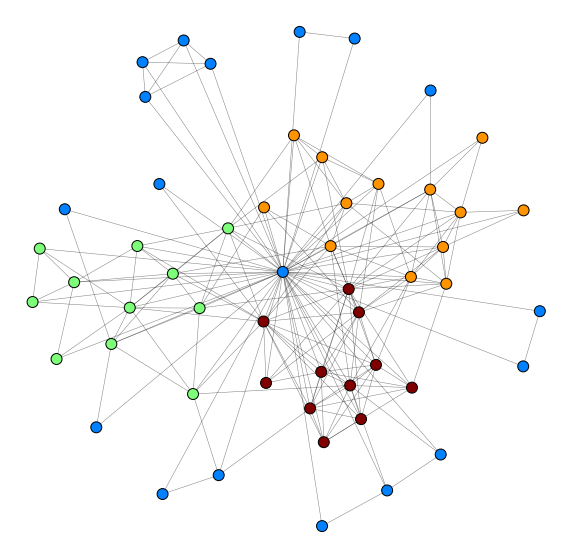

Modularity of community partitions:  9 
 0.35815222936435065 

Modified Dictionary defaultdict(<class 'list'>, {0: [3980, 4032, 3983, 3999, 4005, 3996, 4029, 4001, 4025, 4016, 4034, 3990, 4036, 4007, 4028, 4012, 3987, 4006], 1: [4038, 4027, 4031, 4013, 4004, 4002, 4020, 3991, 3989, 4011, 594], 2: [4014, 4026, 4021, 3988, 4037, 3995, 3993, 3986, 4017, 3992, 4000, 3985, 4033], 3: [4019, 4023, 4003, 4018, 3997, 3998, 4030, 3982, 3994, 4009, 3981]})
Each Ego Node community partitions:  [[3980, 4032, 3983, 3999, 4005, 3996, 4029, 4001, 4025, 4016, 4034, 3990, 4036, 4007, 4028, 4012, 3987, 4006], [4038, 4027, 4031, 4013, 4004, 4002, 4020, 3991, 3989, 4011, 594], [4014, 4026, 4021, 3988, 4037, 3995, 3993, 3986, 4017, 3992, 4000, 3985, 4033], [4019, 4023, 4003, 4018, 3997, 3998, 4030, 3982, 3994, 4009, 3981]] 

Validate partions:  4 

time taken for 9 st Ego network 0.01021500000024389 seconds
Final List of Communities of all Ego nodes:  [[[0, 117, 23, 116, 288, 270, 76, 28, 312, 214, 20, 307,

<Figure size 936x360 with 0 Axes>

In [96]:
# Community detection for each ego network using Louvain  algorithm
from collections import defaultdict
communities_L = []
modularity_L = []
time_L = []
for i, graph in enumerate(ego_graphs):
    st = time.clock()
    Louvain_communities =  community.best_partition(graph)
    et = time.clock() - st
    pos = nx.spring_layout(graph)
    plt_g.plot_bestpartition_communities(graph, pos, Louvain_communities, 10, 'ego_'+str(egoNodes[i])+'L_comm')

    modul = community.modularity(Louvain_communities,graph)
    print("Modularity of community partitions: ",i,'\n',modul,'\n')

    
    modularity_L.append(modul)
    
    
    dictaNew = defaultdict(list)

    for key,val in Louvain_communities.items():
        if val in dictaNew.keys():
            dictaNew[val].append(key)
        else:
            dictaNew[val]= [key]

    print("Modified Dictionary",dictaNew)


    communities_Louvain = []
    for key,value in dictaNew.items():
      communities_Louvain.append(value)
    print("Each Ego Node community partitions: ",communities_Louvain,'\n')
    print("Validate partions: ",len(communities_Louvain),'\n')

    communities_L.append(communities_Louvain)
    print("time taken for", i, "st Ego network",et, "seconds")
    time_L.append(et)

print("Final List of Communities of all Ego nodes: ",communities_L,'\n')
print("length of final list: ",len(communities_L))
print("Total time taken to cluster all ego Networks: ",sum(time_L)/10 ,"seconds")
print("Modularity of all ego network communities graph for Louvian : ", sum(modularity_L)/10)

Evaluating Louvian communities without ground truth table. Evaluation metrics : Modularity, Separability, Cluster Coefficient, Density of the formed communities

In [0]:
clustering_coffe_L = []
density_par_L = []
separ_L = []

Name: 
Type: Graph
Number of nodes: 8
Number of edges: 19
Average degree:   4.7500



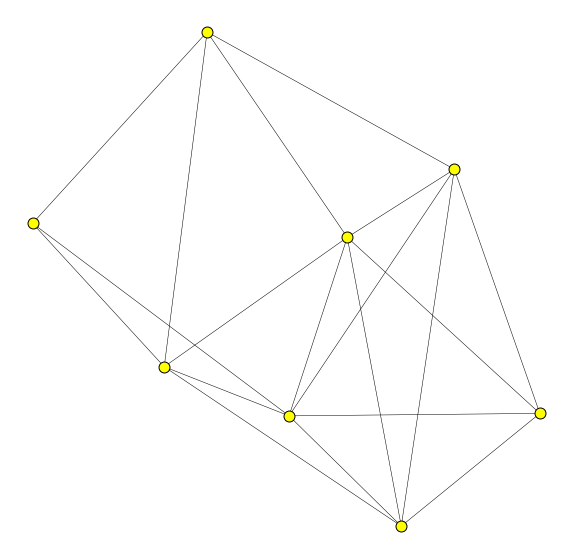

Clustering coefficent : 0.6916666666666667 

Density:  0.6785714285714286 

Separability:  0.03264604810996564 



In [101]:

comm_graph_L, comm_edges_L = read_ego.read_communities_detected(communities_L[5][1],total_edges[5],egoNodes[5])

# Clustering coefficient

cluster_cof_L = nx.average_clustering(comm_graph_L)
print("Clustering coefficent :",cluster_cof_L,'\n')
clustering_coffe_L.append(cluster_cof_L)


# Density

density_L = nx.density(comm_graph_L) 
print("Density: ",density_k5,'\n')
density_par_L.append(density_L)

# Separability

internal_edges_L = len(comm_edges_L)
external_edges_L = len(list(set(total_edges[5]) - set(comm_edges_L)))
separability_L = internal_edges_L / external_edges_L
print("Separability: ",separability_L,'\n')
separ_L.append(separability_L)


In [77]:
clustering_coffe_L 


[0.8965725178960473,
 0.6916666666666667,
 0.8257937367070495,
 0.8841510341510342,
 0.7]

In [78]:
density_par_L

[0.33986928104575165,
 0.6785714285714286,
 0.6666666666666666,
 0.803030303030303,
 0.7]

In [79]:
separ_L

[0.0947176684881603,
 0.03264604810996564,
 0.23408624229979466,
 0.09671532846715329,
 0.011784511784511785]

In [97]:
print("Average Cluster coefficient of ego network 698 communities for louvian: ", sum(clustering_coffe_L)/len(clustering_coffe_L))

Average Cluster coefficient of ego network 698 communities for louvian:  0.7996367910841595


In [98]:
print("Average Density of ego network 698 communities for louvian : ", sum(density_par_L)/len(density_par_L))

Average Density of ego network 698 communities for louvian :  0.63762753586283


In [99]:
print("Average Separability of ego network 698 communities forLouvian :", sum(separ_L)/len(separ_L))

Average Separability of ego network 698 communities forLouvian : 0.09398995982991713


Evaluate Louvian communities using grouth truth tbale : circles files w.r.t loss function

In [80]:
predict_circles_L = communities_L
true_circles_L = read_ego.read_circles(egoNodes,path)

cost_L = []

total_loss_L = 0


for i, ego in enumerate(egoNodes):
    
    loss_L = algorithms.compute_lossfunction(true_circles_L[i], predict_circles_L[i])
    cost_L.append(loss_L)
    total_loss_L += loss_L

    print("Cost required to update predicted communities w.r.t true circles for ego network : ",i,loss_L,'\n')
    
print("Total cost required to update predicted communities w.r.t true circles for all ego networks : ",total_loss_L,'\n')
print("Average cost required to update predicted communities w.r.t true circles for all ego networks : ",(total_loss_L/len(egoNodes)),'\n')

Cost required to update predicted communities w.r.t true circles for ego network :  0 775.0 

Cost required to update predicted communities w.r.t true circles for ego network :  1 1482.0 

Cost required to update predicted communities w.r.t true circles for ego network :  2 944.0 

Cost required to update predicted communities w.r.t true circles for ego network :  3 231.0 

Cost required to update predicted communities w.r.t true circles for ego network :  4 972.0 

Cost required to update predicted communities w.r.t true circles for ego network :  5 143.0 

Cost required to update predicted communities w.r.t true circles for ego network :  6 1598.0 

Cost required to update predicted communities w.r.t true circles for ego network :  7 10787.0 

Cost required to update predicted communities w.r.t true circles for ego network :  8 1130.0 

Cost required to update predicted communities w.r.t true circles for ego network :  9 151.0 

Total cost required to update predicted communities w.r

Plot Evaluation metrics without ground truth table : plot Cluster coffiecient, Density, Separability to evaluate and compare cluster formed using Girvan Newman and Louvian algorithms 

In [0]:
# For Ego Node 698 plot cluster partion evaluation metrics:
clustercof_list = []
desnsity_list = []
separability_list = []
cost_list = []

clustercof_list.append(clustering_coffe)
clustercof_list.append(clustering_coffe_k5)
clustercof_list.append(clustering_coffe_L)

desnsity_list.append(density_par)
desnsity_list.append(density_par_k5)
desnsity_list.append(density_par_L)

separability_list.append(separ)
separability_list.append(separ_k5)
separability_list.append(separ_L)

cost_list.append(cost)
cost_list.append(cost_k5)
cost_list.append(cost_L)

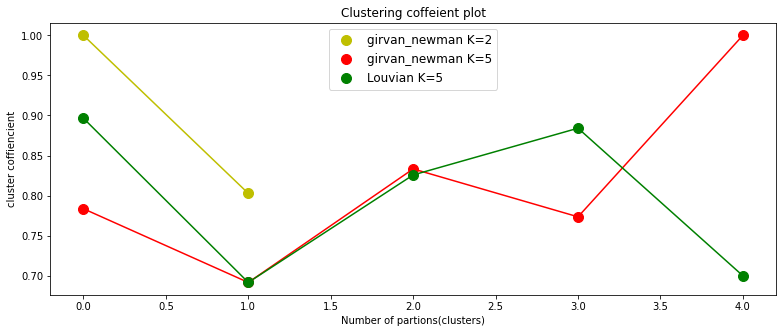

In [82]:
plt_g.plot_eval_metrics('Clustering coffeient plot','Number of partions(clusters)','cluster coffiencient',clustercof_list,"girvan_newman K=2","girvan_newman K=5","Louvian K=5")

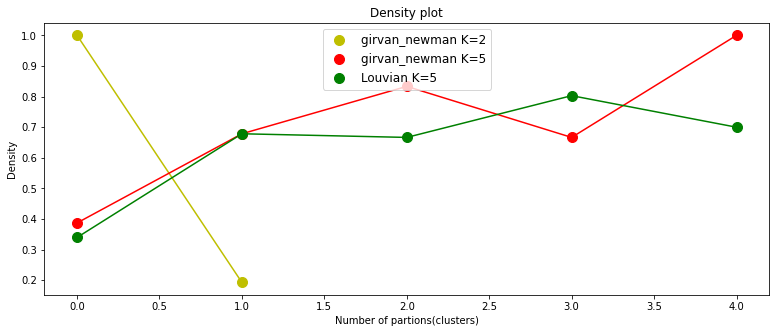

In [83]:
plt_g.plot_eval_metrics('Density plot','Number of partions(clusters)','Density',desnsity_list,"girvan_newman K=2","girvan_newman K=5","Louvian K=5")

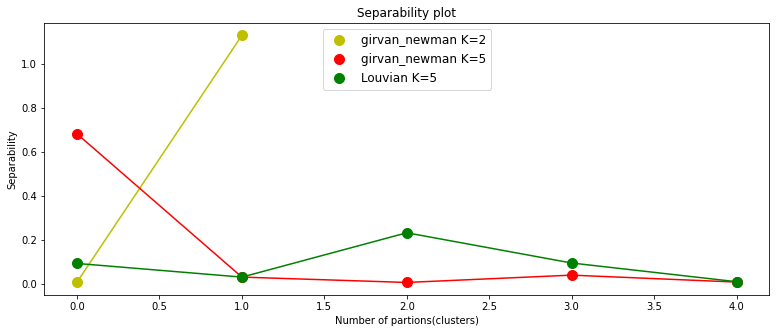

In [84]:
plt_g.plot_eval_metrics('Separability plot','Number of partions(clusters)','Separability',separability_list,"girvan_newman K=2","girvan_newman K=5","Louvian K=5")

In [87]:
cost_list

[[661.0, 1530.0, 601.0, 323.0, 534.0, 155.0, 1452.0, 1915.0, 769.0, 133.0],
 [655.0, 1504.0, 592.0, 311.0, 485.0, 128.0, 1444.0, 1903.0, 761.0, 121.0],
 [775.0, 1482.0, 944.0, 231.0, 972.0, 143.0, 1598.0, 10787.0, 1130.0, 151.0]]

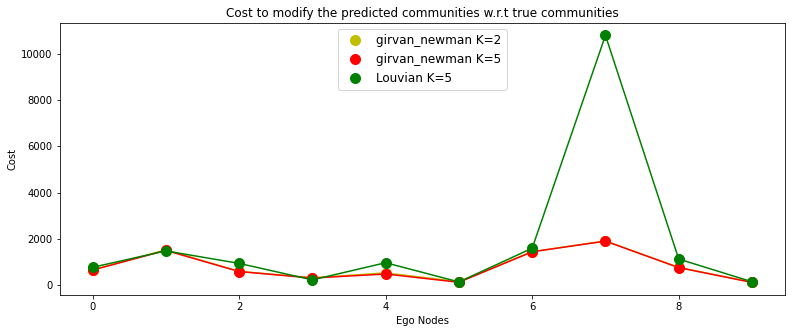

In [88]:
plt_g.plot_eval_metrics('Cost to modify the predicted communities w.r.t true communities','Ego Nodes','Cost',cost_list,"girvan_newman K=2","girvan_newman K=5","Louvian K=5")